In [19]:
import numpy as np
import os
import soundfile as sf
from sklearn.manifold import Isomap
import pickle
import matplotlib.pyplot as plt
import sys
sys.path.append("../src")
import features
import pandas as pd
import librosa
import ftm_ver2
import IPython.display as ipd
import librosa.display

In [23]:
mode = 10
sr = 22050
y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,0.8,
                                        200*np.pi,1e-5,0.01,np.pi,
                                        0.5,sr)
ipd.Audio(y,rate=sr)

In [27]:
y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,0.8,
                                        2000*np.pi,1e-5,0.01,np.pi,
                                        1,sr)
ipd.Audio(y,rate=sr)

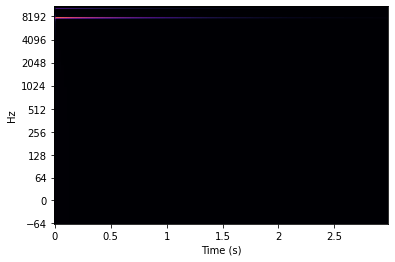

In [28]:
data = librosa.cqt(np.array(y),sr=sr)
librosa.display.specshow(data=data,x_axis="s",y_axis="log")
#estimating the longest decay time in my data, around 1.5s~0.6hz, the smallest j that can recover this at
#22050hz is j=14

## procedure
1. load dataset of drum sounds, or scattering features directly
2. compute various versions of features: cqt, scattering o1, o2
3. fit transform the knn
4. visualize with isomap

In [2]:
feature_path = "/home/han/data/drum_data/han2022features-pkl/"
audio_path = "/home/han/data/drum_data/"
#pkl_fl = open(feature_path, 'rb')
#Sy,y = pickle.load(pkl_fl)

In [19]:
def make_isomap(J,Q,feature_type,feature_path):
    fold_str = "test"
    csv_path = "test_param.csv"
    df = pd.read_csv(csv_path)
    sample_ids = df.values[:, 0]


    #load features
    filename = "_".join([feature_type,"fold-test","J-" + str(J).zfill(2),"Q-" + str(Q).zfill(2)+".pkl"])
    file_path = os.path.join(feature_path,feature_type,filename)
    print(file_path)
    if os.path.exists(file_path):
        pkl_fl = open(file_path, 'rb')
        Sy,y = pickle.load(pkl_fl)
        #normalize by y 
        for i,sample_id in enumerate(sample_ids):
            wav_name = str(sample_id) + "_sound.wav"
            wav_path = os.path.join(audio_path, fold_str, wav_name)
            waveform, _ = sf.read(wav_path)
            Sy[i,:,:] /= np.linalg.norm(waveform,ord=2)
        #isomap
        n_components = 3
        n_neighbors = 40
        Smat = np.maximum(0, Sy.reshape((Sy.shape[0],Sy.shape[1]*Sy.shape[2])))

        sc_isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
        Y = sc_isomap.fit_transform(Smat) #compute knn graph, apply dimensionality reducton
        return [Y,y]
    else:
        return None

def make_isomap_cqt(J,Q,audio_path):
   
        
    df_test = pandas.read_csv("../notebooks/test_param_v2.csv") 
    test_params = df_test.values
    n_samp_test,n_param_val = test_params.shape
    
    path_out = "/home/han/data/drum_data/test/"
    Smat = []
    gts = []
    for i in range(3000):
        gt = test_params[i,1:-1]
        gts.append(gt)
        filename = os.path.join(path_out,str(test_params[i,0])+"_sound.wav")
        y,sr = sf.read(filename)
        fmin = 0.4*sr/np.power(2,J)
        Sy = features.make_cqt(y,Q,sr,J,fmin)/np.linalg.norm(y,ord=2)
        Smat.append(Sy)
    Smat = np.stack(Smat)
    gts = np.stack(gts)
    print(Smat.shape)
    n_components = 3
    n_neighbors = 40
    Smat = np.abs(np.maximum(0, Smat.reshape((Smat.shape[0],Smat.shape[1]*Smat.shape[2]))))
    
    sc_isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
    Y = sc_isomap.fit_transform(Smat) #compute knn graph, apply dimensionality reducton
    
    return [Y,gts]
    
    
def plot_isomap(Y,y,J,Q,feature_type):
    fig = plt.figure(figsize=(20,10))
    #omega
    ax = fig.add_subplot(1, 6, 1, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,0], cmap='bwr');

    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("omega")

    # tau
    ax = fig.add_subplot(1, 6, 2, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,1], cmap='bwr');
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("tau")

    # p
    ax = fig.add_subplot(1, 6, 3, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,2], cmap='bwr');
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("p")
    # D
    ax = fig.add_subplot(1, 6, 4, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,3], cmap='bwr');
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("D")

    # alpha
    ax = fig.add_subplot(1, 6, 5, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,4], cmap='bwr');
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("alpha")
    
    # beta/alpha
    ba = 1/y[:,4]+1/y[:,4]**2
    ba = np.log10(ba.astype(float))
    print(max(ba),min(ba))
    ax = fig.add_subplot(1, 6, 6, projection='3d')
    ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=ba, cmap='bwr');
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.set_title("beta/alpha")
    

    plt.subplots_adjust(wspace=0, hspace=0)
    #plt.savefig(os.path.join("./isomap_plots", '_'.join([feature_type,"J-",str(J),
    #                                                    "Q-",str(Q),"isomap.png"])))

/home/han/data/drum_data/han2022features-pkl/scattering_o1/scattering_o1_fold-test_J-08_Q-01.pkl


TypeError: loop of ufunc does not support argument 0 of type float which has no callable log10 method

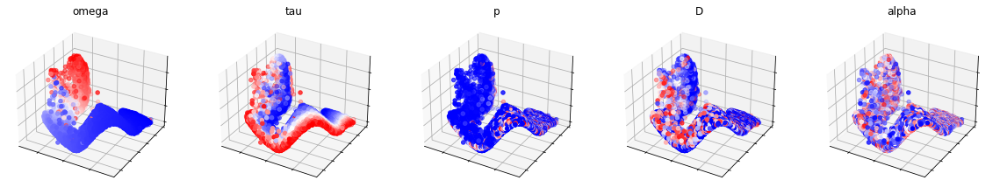

In [5]:
Y = make_isomap(J=8,Q=1,feature_type="scattering_o1",feature_path=feature_path)
plot_isomap(Y[0],Y[1],8,1,"scattering_o1")

7.499438423215442 0.3011023266661534


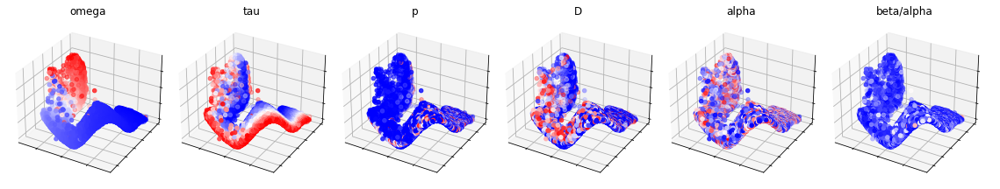

In [20]:
plot_isomap(Y[0],Y[1],8,1,"scattering_o1")

In [21]:
J = 8
Q = 1
feature_type = "scattering_o1"
fold_str = "test"
csv_path = "test_param.csv"
df = pd.read_csv(csv_path)
sample_ids = df.values[:, 0]


#load features
filename = "_".join([feature_type,"fold-test","J-" + str(J).zfill(2),"Q-" + str(Q).zfill(2)+".pkl"])
file_path = os.path.join(feature_path,feature_type,filename)
print(file_path)
if os.path.exists(file_path):
    pkl_fl = open(file_path, 'rb')
    Sy,y = pickle.load(pkl_fl)
    #normalize by y 
    for i,sample_id in enumerate(sample_ids):
        wav_name = str(sample_id) + "_sound.wav"
        wav_path = os.path.join(audio_path, fold_str, wav_name)
        waveform, _ = sf.read(wav_path)
        Sy[i,:,:] /= np.linalg.norm(waveform,ord=2)
    #isomap
    n_components = 3
    n_neighbors = 40
    Smat = np.maximum(0, Sy.reshape((Sy.shape[0],Sy.shape[1]*Sy.shape[2])))

    sc_isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
    Y = sc_isomap.fit_transform(Smat) #compute knn graph, apply dimensionality reducton


/home/han/data/drum_data/han2022features-pkl/scattering_o1/scattering_o1_fold-test_J-08_Q-01.pkl


In [22]:
Sy[100,:,:].flatten().shape

(320,)

In [26]:
# inference an input's k nearest neighbors in the corpus 
sc_isomap.nbrs_.kneighbors(Sy[100,:,:].flatten()[None,:]+1e-11,return_distance=True)

(array([[2.1703793e-06, 6.8300514e-04, 7.1823964e-04, 7.5039139e-04,
         1.0830045e-03, 1.0995037e-03, 1.1604977e-03, 1.3381736e-03,
         1.3749988e-03, 1.3838474e-03, 1.4058714e-03, 1.5988677e-03,
         1.6611223e-03, 1.6650200e-03, 1.7167885e-03, 1.8125466e-03,
         1.8244946e-03, 1.8301605e-03, 1.8406165e-03, 1.8523027e-03,
         1.8807498e-03, 1.9353851e-03, 1.9625325e-03, 2.1168271e-03,
         2.1358116e-03, 2.1782469e-03, 2.2830076e-03, 2.2901862e-03,
         2.3009870e-03, 2.3051181e-03, 2.3254121e-03, 2.3407124e-03,
         2.3749908e-03, 2.4250043e-03, 2.4306653e-03, 2.4435511e-03,
         2.4602960e-03, 2.5746617e-03, 2.6049286e-03, 2.6137882e-03]],
       dtype=float32),
 array([[ 100, 4551, 8620, 1106, 6870, 9946, 3593, 2298, 3783, 3018, 9896,
          253, 1004, 6818, 8994, 5589, 9189, 4024, 5096, 1394, 8144,  336,
          397,  524, 3675, 3683, 6761, 8682, 8673, 7877, 4242,  366, 9807,
         4514, 4253, 9552, 4959, 5450, 4010, 3664]]))

In [26]:
y.shape,Smat.shape

((10000, 5), (10000, 320))

In [12]:
# calculate the mean parameter distance from n neighbors for each example
param_dist = []
n = 5
for i in range(10):#sc_isomap.dist_matrix_.shape[0]):
    param_current = y[i,:]
    nbrs = np.argsort(sc_isomap.dist_matrix_[i,:])[1:n+1]
    #get the parameters of these neighbors 
    param_nbrs = y[nbrs,:]
    print("sound", i)
    wav_name = str(sample_ids[i]) + "_sound.wav"
    wav_path = os.path.join(audio_path, fold_str, wav_name)
    waveform, sr = sf.read(wav_path)
    display(ipd.Audio(waveform,rate=sr))
    for nb in nbrs:
        wav_name = str(sample_ids[nb]) + "_sound.wav"
        wav_path = os.path.join(audio_path, fold_str, wav_name)
        waveform, sr = sf.read(wav_path)
        display(ipd.Audio(waveform,rate=sr))
    #display(ipd.Audio())
    #print(param_nbrs,param_current)
    param_dist.append(np.mean(np.abs(param_nbrs-param_current),axis=0)/np.abs(param_current))
    
param_dist = np.stack(param_dist)#avg neighbor dist for each example
print(param_dist)

sound 0


sound 1


sound 2


sound 3


sound 4


sound 5


sound 6


sound 7


sound 8


sound 9


[[0.007453558245834011 0.0855420748915587 0.7549623280114384
  0.5961251297857734 0.6843510679022525]
 [0.010424882076548849 0.035566678093594074 4.64726862228302
  0.8475538026378542 0.4510639330052589]
 [0.023983400990575048 0.03454369074328887 0.8726434272272959
  0.9683312767515148 0.3879915720002658]
 [0.025219811065802664 0.027998013514649527 16.03548551738846
  5.380313992415864 0.13702168612109966]
 [0.013573219671914376 0.021622724365365827 0.7494022866084782
  1682.74442119365 0.9144385014797471]
 [0.05333330087662645 0.07548711814418485 22.724686892398786
  1.6399970151726306 0.4466399195026964]
 [0.008775044460165901 0.029595412320840654 1.6586494201686606
  115.17625763630801 0.760107987251853]
 [0.030177797002313975 0.04904868805836384 1.4952239459537369
  1354.6224326435672 0.4161588052718836]
 [0.49065104207222077 0.6400789789298045 0.6516444090172827
  0.3490905817058127 0.4020640927943164]
 [0.026707784515763226 0.05030246844735407 9.162288960762968
  96.9448150931547

In [13]:
# calculate the mean parameter distance from n neighbors for each example
param_dist = []
n = 5
for i in range(sc_isomap.dist_matrix_.shape[0]):
    param_current = y[i,:]
    nbrs = np.argsort(sc_isomap.dist_matrix_[i,:])[1:n+1]
    #get the parameters of these neighbors 
    param_nbrs = y[nbrs,:]
    #display(ipd.Audio())
    #print(param_nbrs,param_current)
    param_dist.append(np.mean(np.abs(param_nbrs-param_current),axis=0)/np.abs(param_current))
    
param_dist = np.stack(param_dist)#avg neighbor dist for each example
print(param_dist)

[[0.007453558245834011 0.0855420748915587 0.7549623280114384
  0.5961251297857734 0.6843510679022525]
 [0.010424882076548849 0.035566678093594074 4.64726862228302
  0.8475538026378542 0.4510639330052589]
 [0.023983400990575048 0.03454369074328887 0.8726434272272959
  0.9683312767515148 0.3879915720002658]
 ...
 [0.012762574523138531 0.07091153684536615 15.744783640031097
  0.25816796777172796 2.9722354534384645]
 [0.020762398895372187 0.02215995811059442 29.748587022538963
  0.9531330810100559 0.3216708665281345]
 [0.018120001663900796 0.07925262671395852 0.45225493940533656
  0.9045467111249734 0.3790203213930526]]


In [14]:
1/np.max(param_dist),1/np.min(param_dist)

(7.990253346625627e-05, 1791.5343771775158)

In [10]:
sc_isomap.dist_matrix_.shape

(10000, 10000)

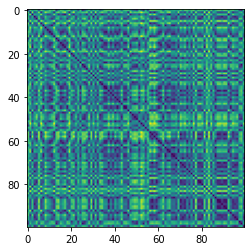

In [17]:
plt.imshow(sc_isomap.dist_matrix_[:100,:100])

/home/han/data/drum_data/han2022features-pkl/scattering_o1/scattering_o1_fold-test_J-08_Q-16.pkl


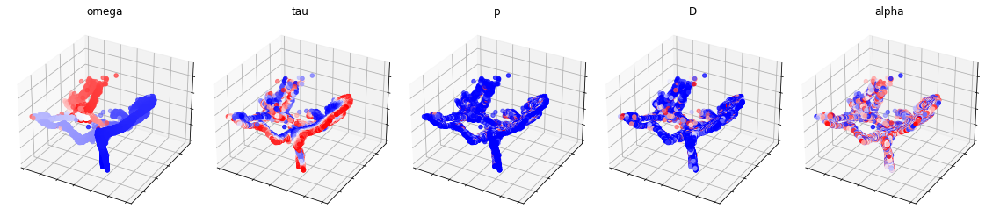

In [27]:
Y = make_isomap(J=8,Q=16,feature_type="scattering_o1",feature_path=feature_path)
plot_isomap(Y[0],Y[1],16,1,"scattering_o1")

/home/han/data/drum_data/han2022features-pkl/scattering_o2/scattering_o2_fold-test_J-08_Q-01.pkl


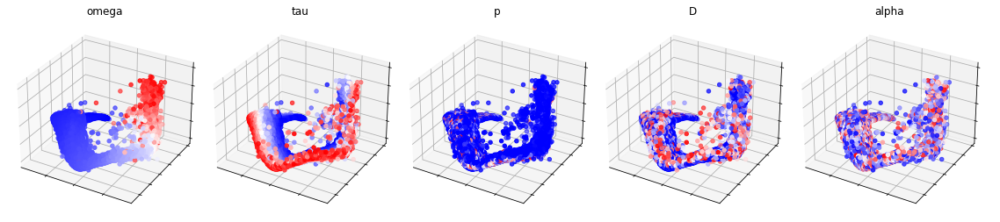

In [28]:
Y = make_isomap(J=8,Q=1,feature_type="scattering_o2",feature_path=feature_path)
plot_isomap(Y[0],Y[1],8,1,"scattering_o2")

In [ ]:
Y = make_isomap_cqt(J=8,Q=1,audio_path=audio_path)
plot_isomap(Y[0],Y[1],8,1,"cqt")

(3000, 8, 257)


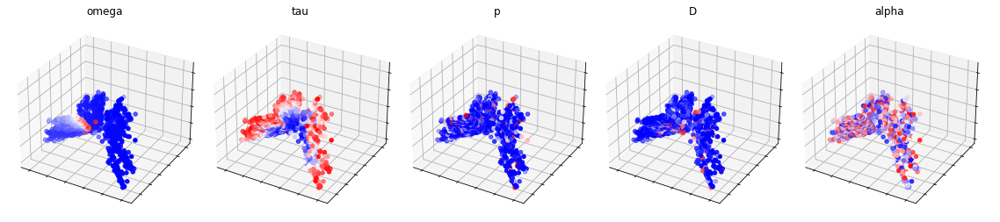

In [35]:
Y = make_isomap_cqt(J=8,Q=1,audio_path=audio_path)
plot_isomap(Y[0],Y[1],8,1,"cqt")

In [29]:
Y = make_isomap_cqt(J=8,Q=1,audio_path=audio_path)

(1000, 8, 257)


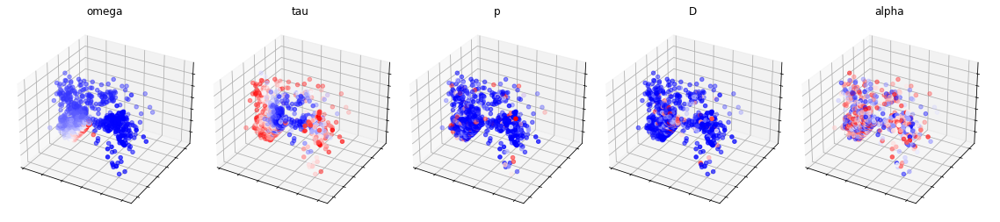

In [31]:
plot_isomap(Y[0],Y[1],8,1,"cqt")

## plot spectral difference vs parameter 
1. sample each parameter in their respective ranges
2. vary one parameter at a time while keeping the other parameters fixed at the center 
3. calulate spectral differences (jtfs, multiscale stft)
4. visualize spectral difference vs each parameter

In [4]:
import ftm_ver2
from kymatio.torch import TimeFrequencyScattering1D,Scattering1D

In [5]:
#define ranges
n_samples = 100
omega = np.logspace(np.log10(80*np.pi),np.log10(2000*np.pi),n_samples)
tau = np.linspace(0.07,0.8,n_samples)
p = np.logspace(np.log10(1e-5),np.log10(0.2),n_samples)
D = np.logspace(np.log10(1e-5),np.log10(0.3),n_samples)
alpha = np.linspace(1e-5,1,n_samples)
mode = 10
l0 = np.pi
sr = 22050
N = 2**16
J = 8
Q = 16
T = 2**8

In [6]:

#calculate reference point
y_ref = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
y_ref = y_ref / max(y_ref)
ref_gt = [tau[len(tau)//2],omega[len(omega)//2],p[len(p)//2],D[len(D)//2],alpha[len(alpha)//2]]

#initialize jtfs
jtfs = TimeFrequencyScattering1D(
                J = J, #scale
                shape = (N, ), 
                Q = Q, #filters per octave, frequency resolution
                T = T, 
                max_pad_factor=1,
                max_pad_factor_fr=1,
                average_fr = False,
            )

ref_jtfs = jtfs(y_ref)




In [6]:
## omega

gts = []
jtfs_mat = []
for o in omega:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        o,p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    jtfs_mat.append(jtfs(y))
    gts.append([tau[len(tau)//2],o,p[len(p)//2],D[len(D)//2],alpha[len(alpha)//2]])

jtfs_mat = np.stack(jtfs_mat)
gts = np.stack(gts)

##tau 

gts_tau = []
jtfs_mat_tau = []
for t in tau:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,t,
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    jtfs_mat_tau.append(jtfs(y))
    gts_tau.append(t)

jtfs_mat_tau = np.stack(jtfs_mat_tau)
gts_tau = np.stack(gts_tau)
print("finished tau")
## p
gts_p = []
jtfs_mat_p = []
for pp in p:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],pp,D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    jtfs_mat_p.append(jtfs(y))
    gts_p.append(pp)

jtfs_mat_p = np.stack(jtfs_mat_p)
gts_p = np.stack(gts_p)
print("finished p")

## D
gts_D = []
jtfs_mat_D = []
for d in D:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],d,l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    jtfs_mat_D.append(jtfs(y))
    gts_D.append(d)

jtfs_mat_D = np.stack(jtfs_mat_D)
gts_D = np.stack(gts_D)
print("finished D")

## alpha
gts_a = []
jtfs_mat_a = []
for a in alpha:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        a,sr)
    y = y/ max(y)
    jtfs_mat_a.append(jtfs(y))
    gts_a.append(a)

jtfs_mat_a = np.stack(jtfs_mat_a)
gts_a = np.stack(gts_a)
print("finished alpha")

finished tau
finished p
finished D
finished alpha


In [7]:
interm = jtfs_mat-ref_jtfs.numpy()[None,:,:,:]
interm = interm.reshape((interm.shape[0],interm.shape[1]*interm.shape[2]*interm.shape[3]))
interm_t = jtfs_mat_tau-ref_jtfs.numpy()[None,:,:,:]
interm_t = interm_t.reshape((interm_t.shape[0],interm_t.shape[1]*interm_t.shape[2]*interm_t.shape[3]))

interm_p = jtfs_mat_p-ref_jtfs.numpy()[None,:,:,:]
interm_p = interm_p.reshape((interm_p.shape[0],interm_p.shape[1]*interm_p.shape[2]*interm_p.shape[3]))

interm_D = jtfs_mat_D-ref_jtfs.numpy()[None,:,:,:]
interm_D = interm_D.reshape((interm_D.shape[0],interm_D.shape[1]*interm_D.shape[2]*interm_D.shape[3]))

interm_a = jtfs_mat_a-ref_jtfs.numpy()[None,:,:,:]
interm_a = interm_a.reshape((interm_a.shape[0],interm_a.shape[1]*interm_a.shape[2]*interm_a.shape[3]))


jtfs_mat_dis = np.sqrt(np.mean(interm**2,axis=1))
jtfs_mat_dis_t = np.sqrt(np.mean(interm_t**2,axis=1))
jtfs_mat_dis_p = np.sqrt(np.mean(interm_p**2,axis=1))
jtfs_mat_dis_D = np.sqrt(np.mean(interm_D**2,axis=1))
jtfs_mat_dis_a = np.sqrt(np.mean(interm_a**2,axis=1))

gt_dis = gts - np.array(ref_gt)[None,:]
gt_dis_tau = gts_tau - ref_gt[0]#np.array(ref_gt)[None,0]
gt_dis_p = gts_p - ref_gt[2]#np.array(ref_gt)[None,2]
gt_dis_D = gts_D - ref_gt[3]#np.array(ref_gt)[None,3]
gt_dis_a = gts_a - ref_gt[4]#np.array(ref_gt)[None,4]

In [36]:
jtfs_mat_dis_p.shape,gt_dis_p.shape,np.array(ref_gt).shape,gts_tau.shape

((100,), (100,), (5,), (100,))

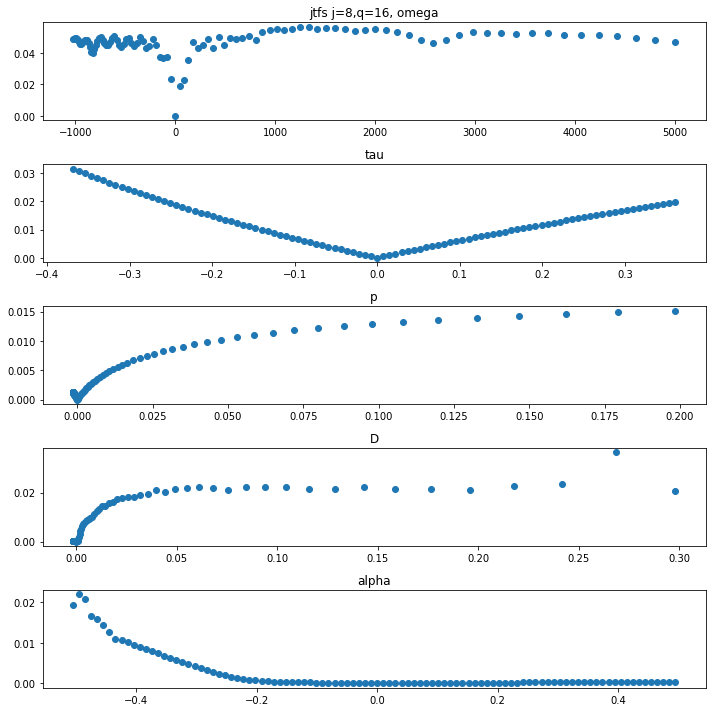

In [13]:
plt.subplots(5,1,figsize=(10,10))
plt.subplot(5,1,1)
plt.scatter(gt_dis[:,1],jtfs_mat_dis)
plt.title("jtfs j=8,q=16, omega")
plt.subplot(5,1,2)
plt.scatter(gt_dis_tau,jtfs_mat_dis_t)
plt.title("tau")
plt.subplot(5,1,3)
plt.scatter(gt_dis_p,jtfs_mat_dis_p)
plt.title("p")
plt.subplot(5,1,4)
plt.scatter(gt_dis_D,jtfs_mat_dis_D)
plt.title("D")
plt.subplot(5,1,5)
plt.scatter(gt_dis_a,jtfs_mat_dis_a)
plt.title("alpha")
plt.tight_layout()

multiscale STFT difference

In [7]:
import torch
import auraloss


In [8]:
mrstft = auraloss.freq.MultiResolutionSTFTLoss()
#calculate reference point
y_ref = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
y_ref = y_ref / max(y_ref)
ref_gt = [tau[len(tau)//2],omega[len(omega)//2],p[len(p)//2],D[len(D)//2],alpha[len(alpha)//2]]


In [23]:
mrstft = auraloss.freq.MultiResolutionSTFTLoss()

gts = []
stft_diff_o = []
for o in omega:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        o,p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    
    stft_diff_o.append(loss)
    gts.append(o)

##tau 
gts_tau = []
stft_diff_tau = []
for t in tau:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,t,
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    stft_diff_tau.append(loss)
    gts_tau.append(t)

print("finished tau")

## p
gts_p = []
stft_diff_p = []
for pp in p:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],pp,D[len(D)//2],l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    stft_diff_p.append(loss)
    gts_p.append(pp)

print("finished p")

## D
gts_D = []
stft_diff_D = []
for d in D:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],d,l0,
                                        alpha[len(alpha)//2],sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    stft_diff_D.append(loss)
    gts_D.append(d)

print("finished D")

## alpha
gts_a = []
stft_diff_a = []
for a in alpha:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        a,sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    stft_diff_a.append(loss)
    gts_a.append(a)

print("finished alpha")


finished tau
finished p
finished D
finished alpha


In [9]:
inv_alpha = np.linspace(1e-11,1,100) #sample 1/alpha^2
alpha = 1/np.sqrt(inv_alpha)#np.minimum(1/inv_alpha,inv_alpha)
print(alpha)
## alpha
gts_a = []
stft_diff_a = []
for a in alpha:
    y = ftm_ver2.getsounds_dif_linear_nonorm(mode,mode,0.5,0.5,0.03,tau[len(tau)//2],
                                        omega[len(omega)//2],p[len(p)//2],D[len(D)//2],l0,
                                        a,sr)
    y = y/ max(y)
    loss = mrstft(torch.tensor(y), torch.tensor(y_ref))
    stft_diff_a.append(loss)
    gts_a.append(a)

print("finished alpha")


[3.16227766e+05 9.94987437e+00 7.03562364e+00 5.74456265e+00
 4.97493718e+00 4.44971909e+00 4.06201920e+00 3.76069902e+00
 3.51781182e+00 3.31662479e+00 3.14642654e+00 3.00000000e+00
 2.87228132e+00 2.75959863e+00 2.65921578e+00 2.56904652e+00
 2.48746859e+00 2.41319900e+00 2.34520788e+00 2.28265773e+00
 2.22485955e+00 2.17124059e+00 2.12132034e+00 2.07469222e+00
 2.03100960e+00 1.98997487e+00 1.95133091e+00 1.91485422e+00
 1.88034951e+00 1.84764529e+00 1.81659021e+00 1.78705019e+00
 1.75890591e+00 1.73205081e+00 1.70638938e+00 1.68183573e+00
 1.65831240e+00 1.63574927e+00 1.61408276e+00 1.59325501e+00
 1.57321327e+00 1.55390931e+00 1.53529895e+00 1.51734162e+00
 1.50000000e+00 1.48323970e+00 1.46702894e+00 1.45133834e+00
 1.43614066e+00 1.42141062e+00 1.40712473e+00 1.39326109e+00
 1.37979932e+00 1.36672035e+00 1.35400640e+00 1.34164079e+00
 1.32960789e+00 1.31789306e+00 1.30648251e+00 1.29536331e+00
 1.28452326e+00 1.27395087e+00 1.26363531e+00 1.25356634e+00
 1.24373430e+00 1.234130

Text(0.5, 0, 'alpha')

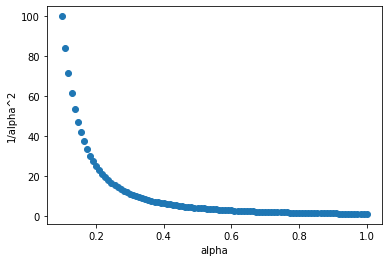

In [9]:
alpha = np.linspace(0.1,1,100)
a = 1/alpha**2
plt.scatter(alpha,a)
plt.ylabel("1/alpha^2")
plt.xlabel("alpha")

Text(0, 0.5, 'alpha')

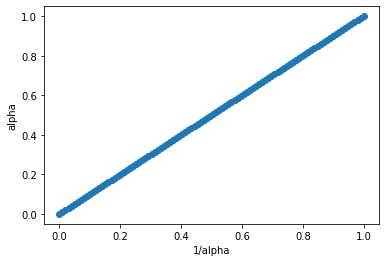

In [99]:
a = np.linspace(1e-11,1,100)
alpha = 1/a #(1+np.sqrt(1-4*a))/(2*a) #inevitable discontinuity from finding roots of a second order polynomial
alpha = np.minimum(alpha,1/alpha)
plt.scatter(a,alpha)
plt.xlabel("1/alpha")
plt.ylabel("alpha")

In [101]:
ref_gt

[0.4386868686868687,
 1277.2331063818501,
 0.0014867480294288155,
 0.0018246196636063476,
 0.5050554545454545]

(0.0, 1.0)

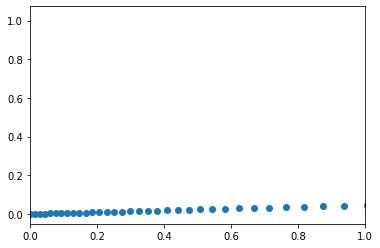

In [45]:
gt_dis_a = gts_a - ref_gt[4]
plt.scatter(gt_dis_a,stft_diff_a)
plt.xlim([0,1])

In [24]:
gt_dis = gts - ref_gt[1]
gt_dis_tau = gts_tau - ref_gt[0]
gt_dis_p = gts_p - ref_gt[2]
gt_dis_D = gts_D - ref_gt[3]
gt_dis_a = gts_a - ref_gt[4]

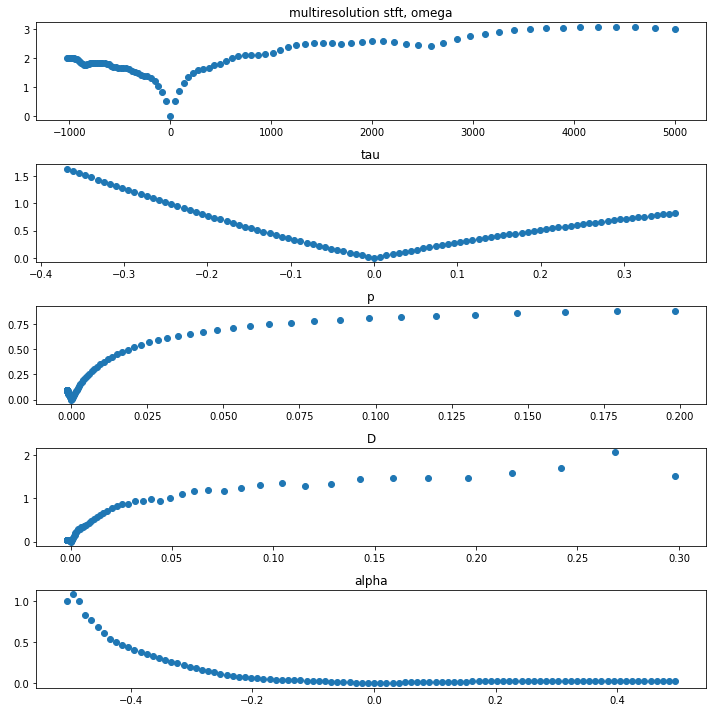

In [25]:
plt.subplots(5,1,figsize=(10,10))
plt.subplot(5,1,1)
plt.scatter(gt_dis,stft_diff_o)
plt.title("multiresolution stft, omega")
plt.subplot(5,1,2)
plt.scatter(gt_dis_tau,stft_diff_tau)
plt.title("tau")
plt.subplot(5,1,3)
plt.scatter(gt_dis_p,stft_diff_p)
plt.title("p")
plt.subplot(5,1,4)
plt.scatter(gt_dis_D,stft_diff_D)
plt.title("D")
plt.subplot(5,1,5)
plt.scatter(gt_dis_a,stft_diff_a)
plt.title("alpha")
plt.tight_layout()

In [5]:
from kymatio.torch import TimeFrequencyScattering1D,Scattering1D
#spectral difference over parameter axis
#JTFS 
def cal_dist_jtfs(N,J,Q,T):
    #N = 2**16
    jtfs = TimeFrequencyScattering1D(
                J = J, #scale, how big the biggest time support (for the lowest freqeuncy), where center frequencies are?
                shape = (N, ), 
                Q = Q, #filters per octave, frequency resolution
                T = T, 
                max_pad_factor=1,
                max_pad_factor_fr=1,
                average_fr = False,
            )

    df_test = pandas.read_csv("../notebooks/test_param_v2.csv") 
    test_params = df_test.values
    n_samp_test,n_param_val = test_params.shape

    path_out = "/home/han/data/drum_data/test/"
    jtfs_mat = []
    gts = []
    for i in range(100):
        gt = test_params[i,1:-1]
        gts.append(gt)
        filename = os.path.join(path_out,str(test_params[i,0])+"_sound.wav")
        y,sr = sf.read(filename)
        Sy = jtfs(y)
        jtfs_mat.append(Sy)
    jtfs_mat = np.stack(jtfs_mat)
    gts = np.stack(gts)
    return jtfs_mat,gts

In [20]:
jtfs_mat,gts = cal_dist_jtfs(N=2**16,J=8,Q=16,T=2**8)

In [16]:
#calclate distance from i
i = 20

print(gts[i,:])
interm = jtfs_mat-jtfs_mat[i,:,:,:][None,:,:,:]

interm = interm.reshape((interm.shape[0],interm.shape[1]*interm.shape[2]*interm.shape[3]))
print(interm.shape)
jtfs_mat_dis = np.sqrt(np.mean(interm**2,axis=1))
gt_dis = gts - gts[i,:][None,:]
print(jtfs_mat_dis.shape)

[2970.9124986555016 0.120062799259003 2.9255487278130088e-05
 0.0258889068158985 0.9006023352593878]
(100, 79616)
(100,)


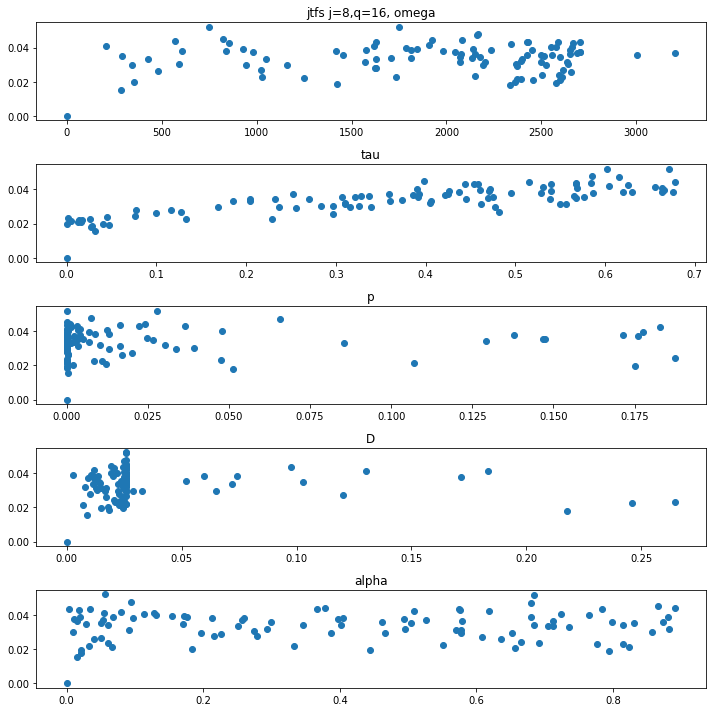

In [15]:
jtfs_mat,gts = cal_dist_jtfs(N=2**16,J=8,Q=16,T=2**8)
i = 20
interm = jtfs_mat-jtfs_mat[i,:,:,:][None,:,:,:]
interm = interm.reshape((interm.shape[0],interm.shape[1]*interm.shape[2]*interm.shape[3]))
jtfs_mat_dis = np.sqrt(np.mean(interm**2,axis=1))
gt_dis = np.abs(gts - gts[i,:])

plt.subplots(5,1,figsize=(10,10))
plt.subplot(5,1,1)
plt.scatter(gt_dis[:,0],jtfs_mat_dis)
plt.title("jtfs j=8,q=16, omega")
plt.subplot(5,1,2)
plt.scatter(gt_dis[:,1],jtfs_mat_dis)
plt.title("tau")
plt.subplot(5,1,3)
plt.scatter(gt_dis[:,2],jtfs_mat_dis)
plt.title("p")
plt.subplot(5,1,4)
plt.scatter(gt_dis[:,3],jtfs_mat_dis)
plt.title("D")
plt.subplot(5,1,5)
plt.scatter(gt_dis[:,4],jtfs_mat_dis)
plt.title("alpha")
plt.tight_layout()

In [12]:
gt_dis = np.abs(gts - gts[i,:])
gt_dis.shape,jtfs_mat_dis.shape

((100, 5), (100,))

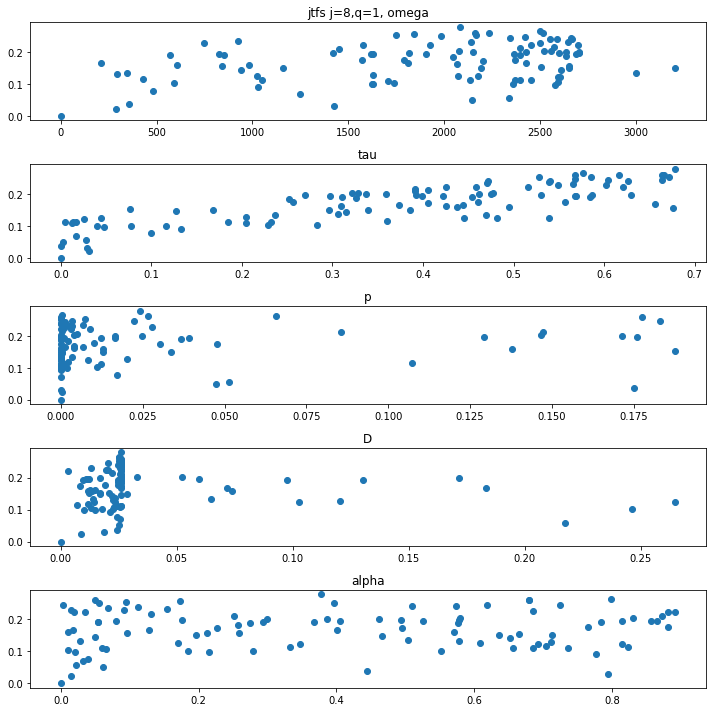

In [13]:
jtfs_mat,gts = cal_dist_jtfs(N=2**16,J=8,Q=1,T=2**8)
i = 20
interm = jtfs_mat-jtfs_mat[i,:,:,:][None,:,:,:]
interm = interm.reshape((interm.shape[0],interm.shape[1]*interm.shape[2]*interm.shape[3]))
jtfs_mat_dis = np.sqrt(np.mean(interm**2,axis=1))
gt_dis = np.abs(gts - gts[i,:])#[None,:]


plt.subplots(5,1,figsize=(10,10))
plt.subplot(5,1,1)
plt.scatter(gt_dis[:,0],jtfs_mat_dis)
plt.title("jtfs j=8,q=1, omega")
plt.subplot(5,1,2)
plt.scatter(gt_dis[:,1],jtfs_mat_dis)
plt.title("tau")
plt.subplot(5,1,3)
plt.scatter(gt_dis[:,2],jtfs_mat_dis)
plt.title("p")
plt.subplot(5,1,4)
plt.scatter(gt_dis[:,3],jtfs_mat_dis)
plt.title("D")
plt.subplot(5,1,5)
plt.scatter(gt_dis[:,4],jtfs_mat_dis)
plt.title("alpha")
plt.tight_layout()

In [ ]:
feature_path = "/home/han/data/drum_data/han2022features-pkl/"


/home/han/data/drum_data/han2022features-pkl/scattering_o1/scattering_o1_fold-test_J-08_Q-01.pkl
[array([[-0.65401301, -0.70849046,  0.68070327],
       [ 1.05484973, -0.81278601, -0.35651475],
       [-0.72185066,  0.54159134, -0.05629449],
       ...,
       [-0.30058126,  0.71474249, -0.04927322],
       [ 1.24617581, -0.05054319,  0.03373334],
       [ 0.57129012, -0.50400327, -0.09547105]]), array([[5975.380052163951, 0.4263183057619311, 0.0001563027169101,
        0.0024473037292406, 0.3962924629201282],
       [282.8072297406747, 0.5420853770734272, 4.440857259814719e-05,
        0.0165198392250867, 0.8472515992986044],
       [1988.017411145828, 0.5452114324996362, 0.0041243491878502,
        0.0135060780734318, 0.911237321426838],
       ...,
       [1364.7598089528742, 0.4881381579129026, 0.0009398582118027,
        0.2167940970505399, 0.0931019387674069],
       [452.41292017387616, 0.6813376361895354, 2.487956798874492e-05,
        0.0318312886856591, 0.7864300702093032],
 

[array([[-0.19472052, -0.13352143, -0.00271231],
       [-0.19273733,  0.82940914,  0.44137516],
       [-0.34830387, -0.22660502, -0.04608647],
       ...,
       [-0.45612821, -0.35843433, -0.07707273],
       [ 0.4502587 ,  0.51027326, -0.41828474],
       [-0.0785851 ,  0.63098102,  0.2119092 ]]), array([[5975.380052163951, 0.4263183057619311, 0.0001563027169101,
        0.0024473037292406, 0.3962924629201282],
       [282.8072297406747, 0.5420853770734272, 4.440857259814719e-05,
        0.0165198392250867, 0.8472515992986044],
       [1988.017411145828, 0.5452114324996362, 0.0041243491878502,
        0.0135060780734318, 0.911237321426838],
       ...,
       [1364.7598089528742, 0.4881381579129026, 0.0009398582118027,
        0.2167940970505399, 0.0931019387674069],
       [452.41292017387616, 0.6813376361895354, 2.487956798874492e-05,
        0.0318312886856591, 0.7864300702093032],
       [327.8095652764681, 0.1937478362755857, 0.1175019481536829,
        0.1803211077661382, 0.7

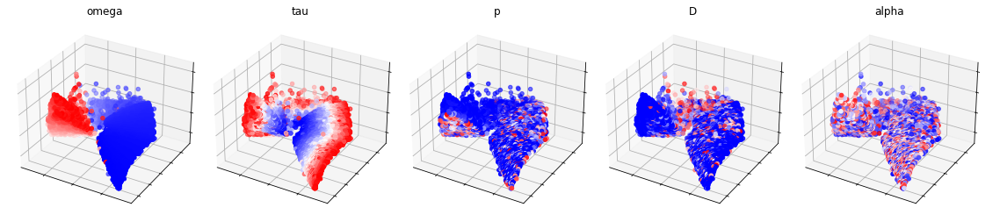

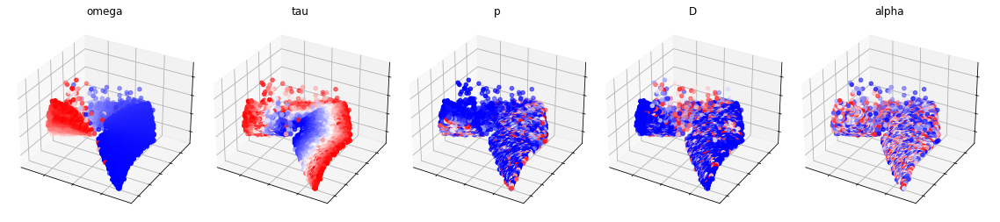

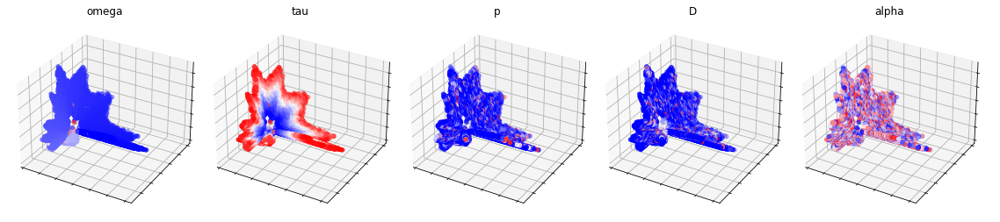

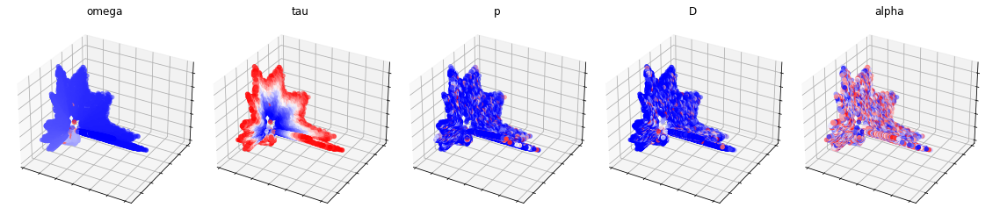

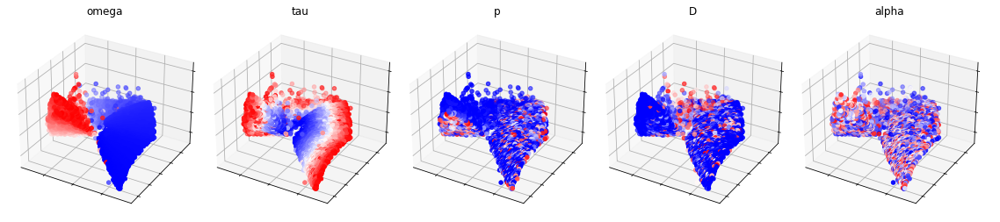

...

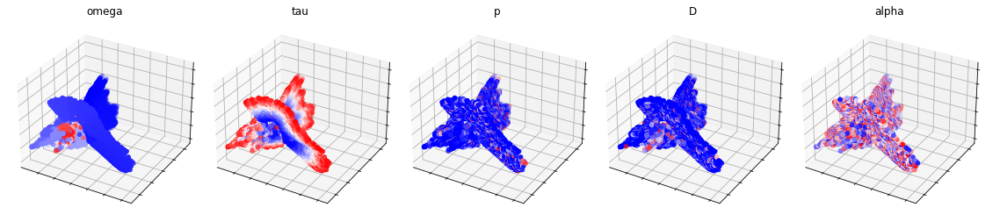

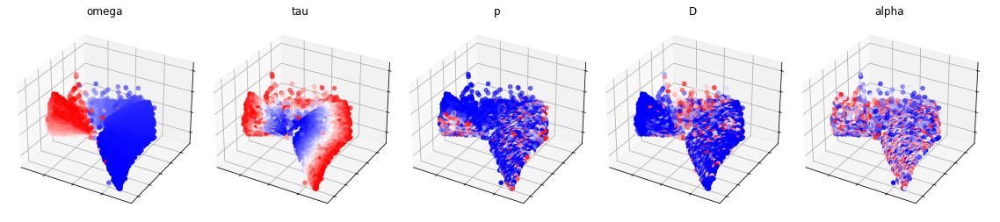

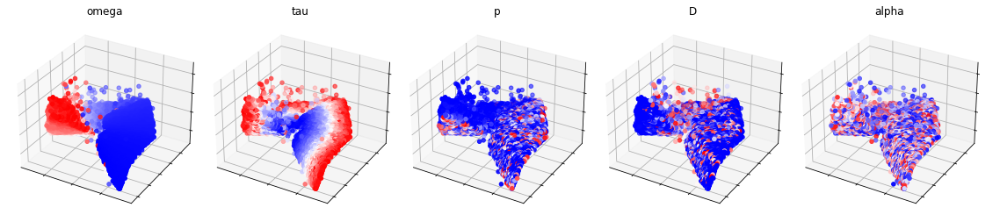

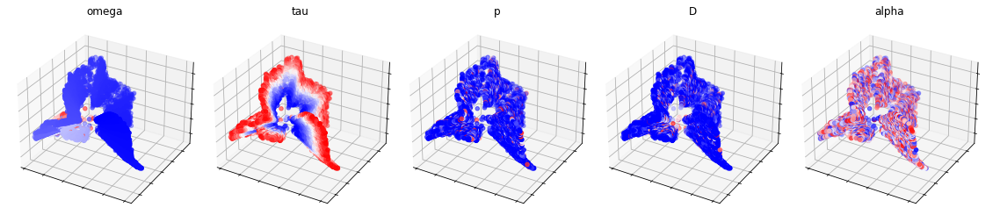

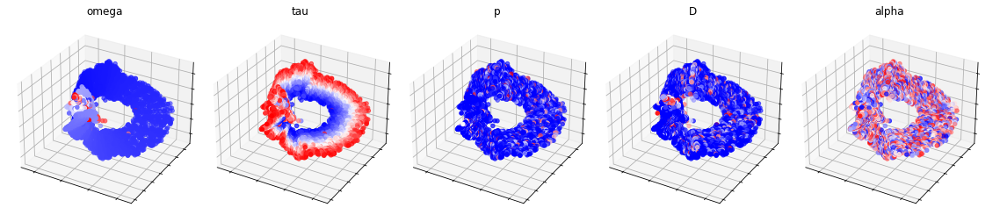

In [27]:
feature_path = "/home/han/data/drum_data/han2022features-pkl/"
for j in ["08",10,12]:
    for q in ["01",16]:
        for ftype in ["scattering_o1","scattering_o2","cqt"]:
            Y = make_isomap(j,q,ftype,feature_path)
            print(Y)
            if Y is not None:
                plot_isomap(Y[0],Y[1],j,q,ftype)
                

In [12]:
n_components = 3
n_neighbors = 40
Smat = np.maximum(0, Sy.reshape((Sy.shape[0],Sy.shape[1]*Sy.shape[2])))

sc_isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
sc_iso = sc_isomap.fit_transform(Smat) #compute knn graph, apply dimensionality reducton


In [13]:
sc_iso.shape

(10000, 3)

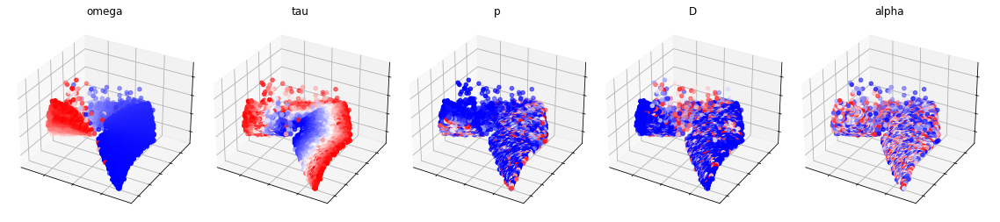

In [21]:
Y = sc_iso
fig = plt.figure(figsize=(20,10))
#omegaa
ax = fig.add_subplot(1, 5, 1, projection='3d')
ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,0], cmap='bwr');

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("omega")

# tau
ax = fig.add_subplot(1, 5, 2, projection='3d')
ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,1], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("tau")

# p
ax = fig.add_subplot(1, 5, 3, projection='3d')
ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,2], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("p")
# D
ax = fig.add_subplot(1, 5, 4, projection='3d')
ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,3], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("D")

# alpha
ax = fig.add_subplot(1, 5, 5, projection='3d')
ax.scatter3D(Y[:, 0], Y[:, 1], Y[:, 2], c=y[:,4], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("alpha")

plt.subplots_adjust(wspace=0, hspace=0)

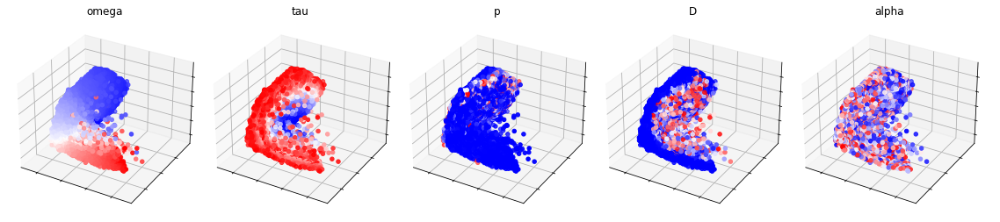

In [24]:
Y = sc_iso
fig = plt.figure(figsize=(20,10))
#omegaa
ax = fig.add_subplot(1, 5, 1, projection='3d')
ax.scatter3D(Y[:, 2], Y[:, 0], Y[:, 1], c=y[:,0], cmap='bwr');

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("omega")

# tau
ax = fig.add_subplot(1, 5, 2, projection='3d')
ax.scatter3D(Y[:, 2], Y[:, 0], Y[:, 1], c=y[:,1], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("tau")

# p
ax = fig.add_subplot(1, 5, 3, projection='3d')
ax.scatter3D(Y[:, 2], Y[:, 0], Y[:, 1], c=y[:,2], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("p")

# D
ax = fig.add_subplot(1, 5, 4, projection='3d')
ax.scatter3D(Y[:, 2], Y[:, 0], Y[:, 1], c=y[:,3], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("D")

# alpha
ax = fig.add_subplot(1, 5, 5, projection='3d')
ax.scatter3D(Y[:, 2], Y[:, 0], Y[:, 1], c=y[:,4], cmap='bwr');
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title("alpha")

plt.subplots_adjust(wspace=0, hspace=0)